In [ ]:
# Install the required libraries
!pip install kaggle opencv-python-headless

# Import file uploader for Colab
from google.colab import files

# Prompt you to upload your kaggle.json file
print("Please upload your kaggle.json file:")
files.upload()

# Move the kaggle.json file to the correct directory
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

print("Kaggle API setup complete.")

Please upload your kaggle.json file:


Saving kaggle.json to kaggle.json
Kaggle API setup complete.


In [ ]:
import zipfile
import os

# Define the dataset
dataset_name = "fareselmenshawii/face-detection-dataset"
file_name = "face-detection-dataset.zip"

subset_dir = "face_subset"
os.makedirs(subset_dir, exist_ok=True)

# 1. Check if file exists (it should from the last run)
if not os.path.exists(file_name):
    print(f"'{file_name}' not found. Please re-run the download cell.")
else:
    print(f"'{file_name}' found. Proceeding with extraction.")

# 2. Extract only a small number of images
num_to_extract = 10  # Let's just get 10 images
extracted_files = []

print(f"\nExtracting {num_to_extract} images from the zip file...")

try:
    with zipfile.ZipFile(file_name, "r") as z:

        # --- THIS IS THE CORRECTED PATH ---
        # Look for images inside the 'images/train/' directory
        all_image_files = [name for name in z.namelist() if name.startswith('images/train/') and name.endswith(('.png', '.jpg', '.jpeg'))]

        if not all_image_files:
            print("Error: No image files found at path 'images/train/'.")
        else:
            # Get just the first 10
            files_to_extract = all_image_files[:num_to_extract]

            for file_path in files_to_extract:
                # Extract the file into our subset directory
                z.extract(file_path, subset_dir)

                # The file will be at 'face_subset/images/train/image_name.jpg'
                full_path = os.path.join(subset_dir, file_path)
                extracted_files.append(full_path)

            print(f"\nSuccessfully extracted {len(extracted_files)} files to the '{subset_dir}' directory.")
            print("Example file path:", extracted_files[0])
            print("\nYou can now run Block 3!")

except FileNotFoundError:
    print(f"Error: The file '{file_name}' was not found.")
except Exception as e:
    print(f"An error occurred: {e}")

finally:
    # 3. IMPORTANT: Delete the 4.4GB zip file to save space
    if os.path.exists(file_name):
        print(f"\nCleaning up and removing {file_name}...")
        os.remove(file_name)
        print("Cleanup complete.")
    else:
        print(f"\nCould not find {file_name} to delete.")

'face-detection-dataset.zip' found. Proceeding with extraction.

Extracting 10 images from the zip file...

Successfully extracted 10 files to the 'face_subset' directory.
Example file path: face_subset/images/train/00006c07d2b033d1.jpg

You can now run Block 3!

Cleaning up and removing face-detection-dataset.zip...
Cleanup complete.


Face detector loaded successfully.

--- Processing: face_subset/images/train/00006c07d2b033d1.jpg ---
Found 3 face(s).


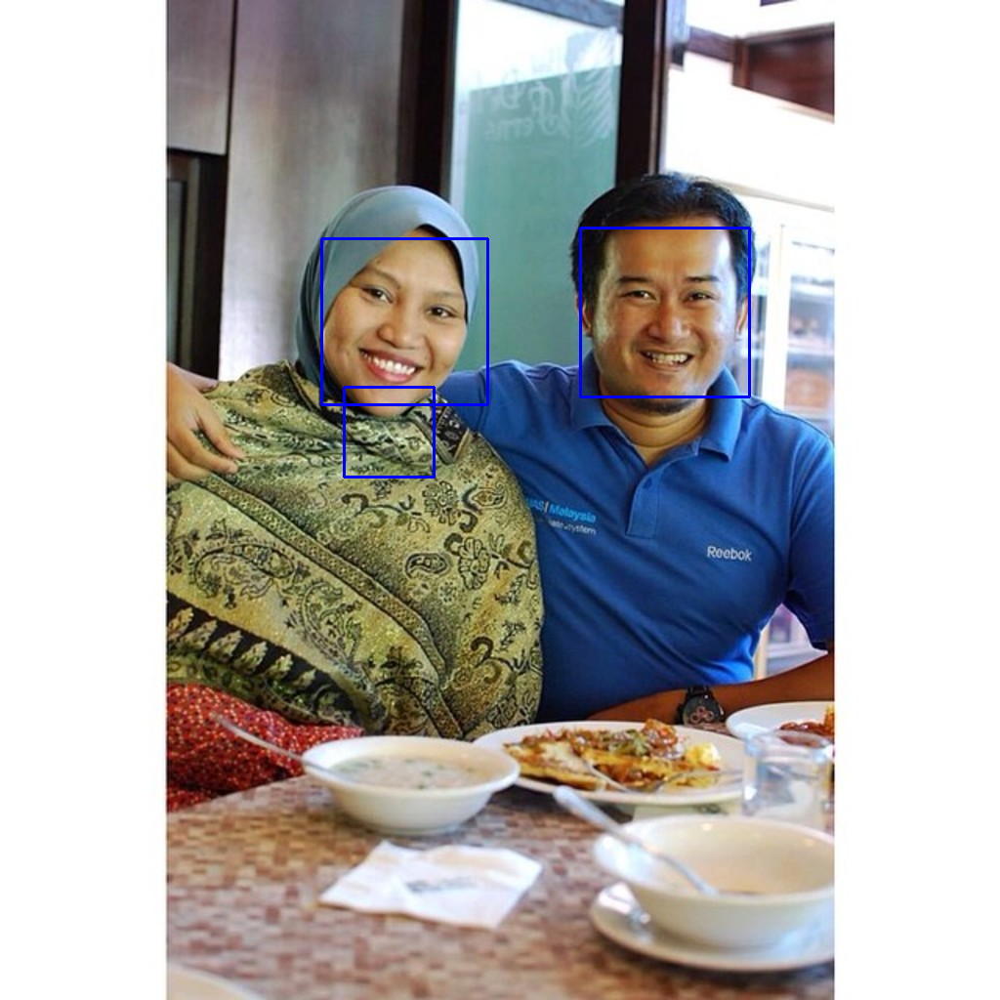

------------------------------
--- Processing: face_subset/images/train/0000bee39176697a.jpg ---
Found 5 face(s).


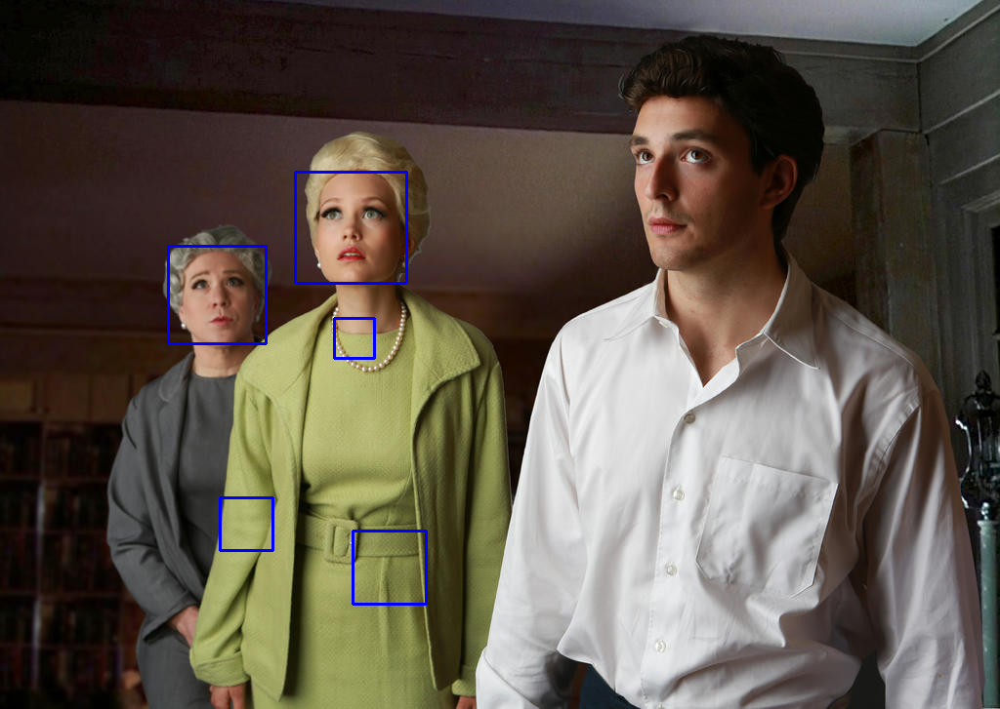

------------------------------
--- Processing: face_subset/images/train/0000eda1171fe14e.jpg ---
Found 2 face(s).


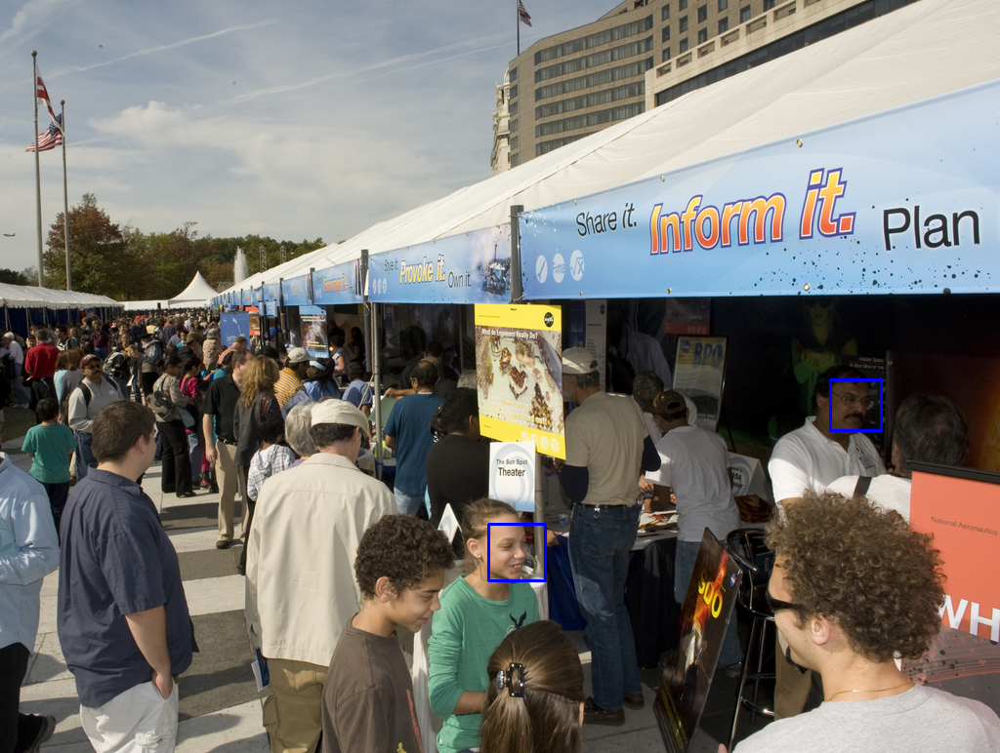

------------------------------
--- Processing: face_subset/images/train/00090bdd55ec42c3.jpg ---
Found 1 face(s).


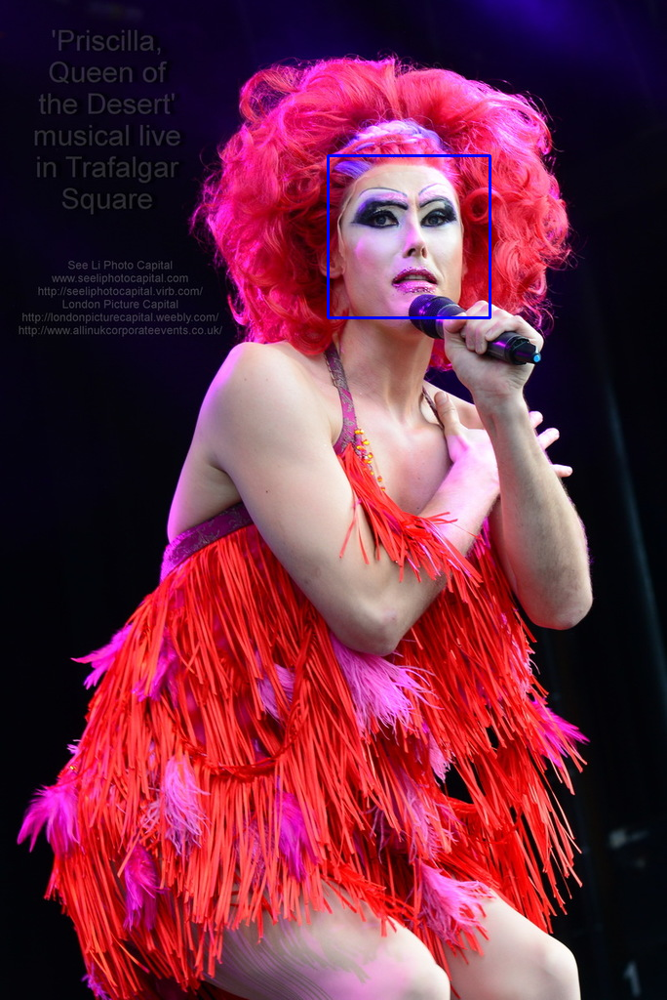

------------------------------
--- Processing: face_subset/images/train/000d1eae99343db8.jpg ---
Found 0 face(s).


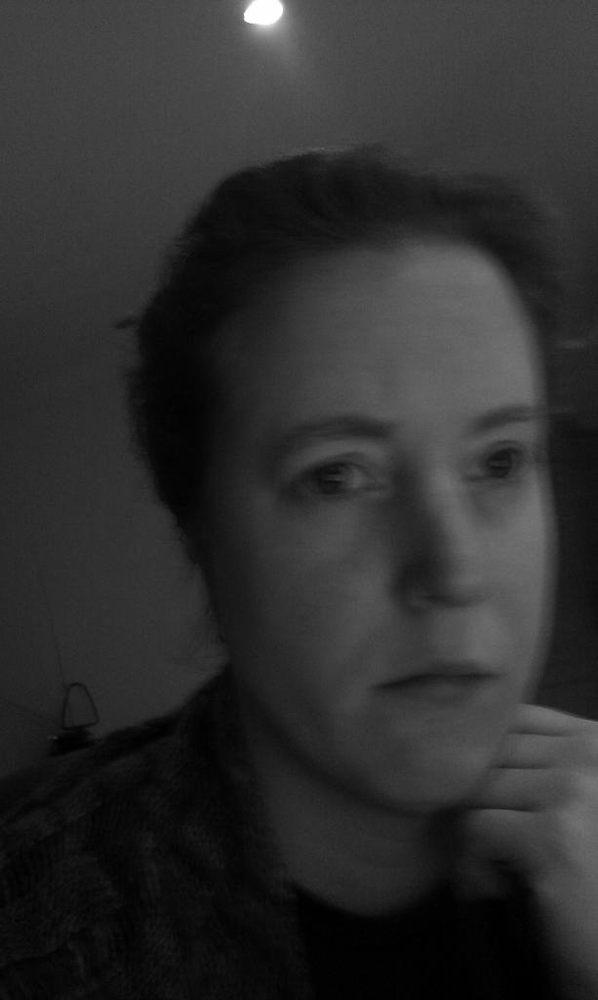

------------------------------
--- Processing: face_subset/images/train/001065b2a612f5ad.jpg ---
Found 2 face(s).


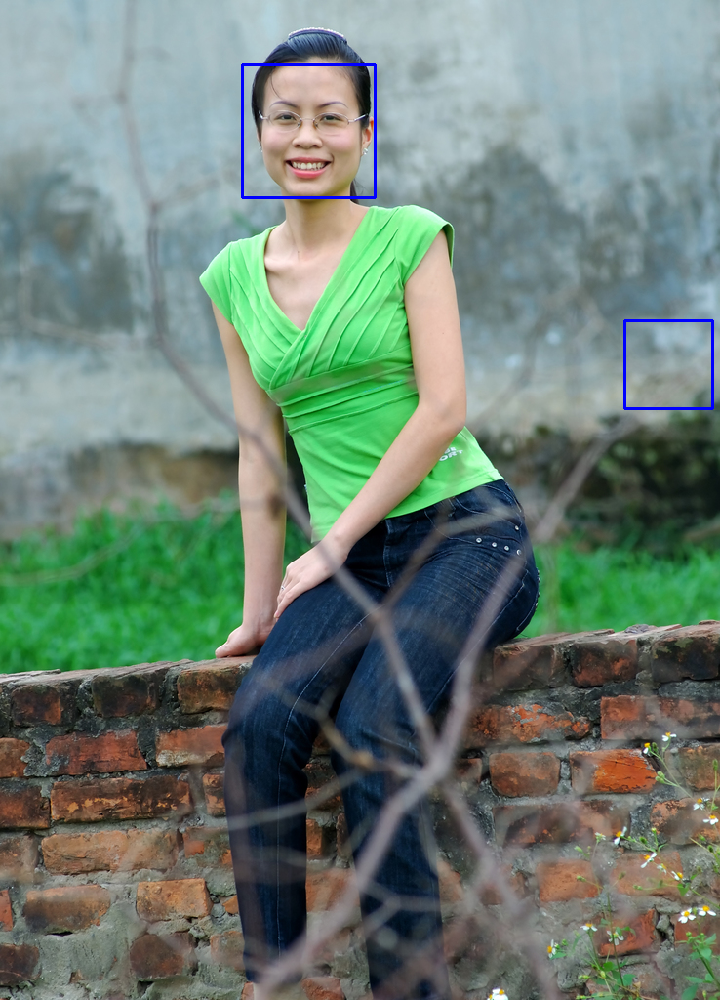

------------------------------
--- Processing: face_subset/images/train/00134c19ee564cad.jpg ---
Found 1 face(s).


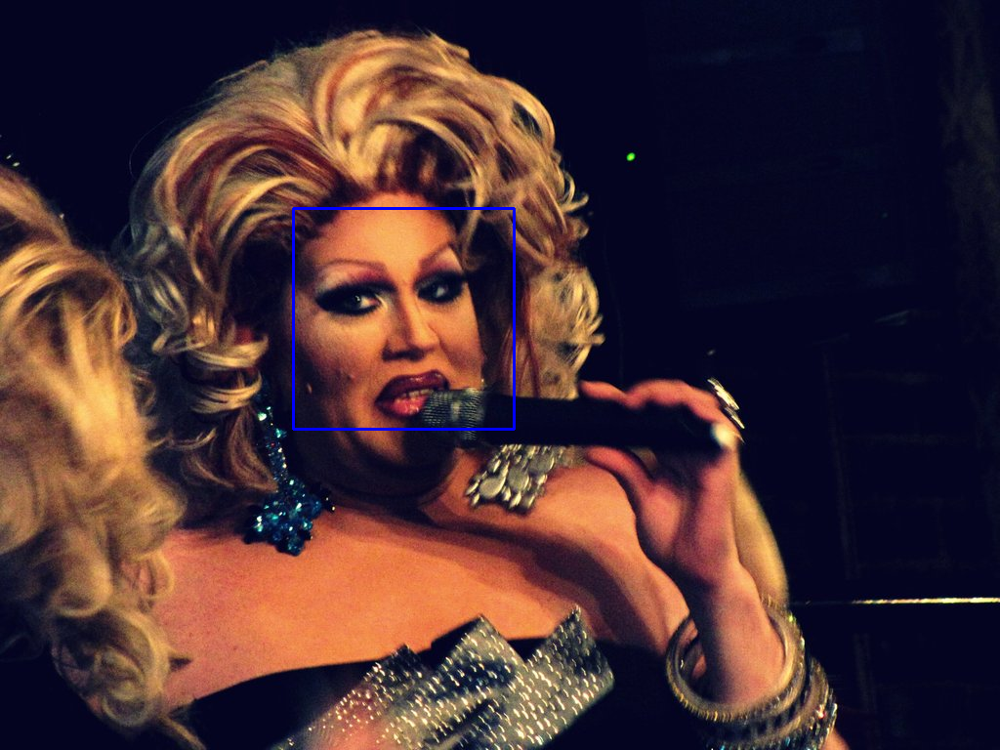

------------------------------
--- Processing: face_subset/images/train/00143d27992ccf33.jpg ---
Found 3 face(s).


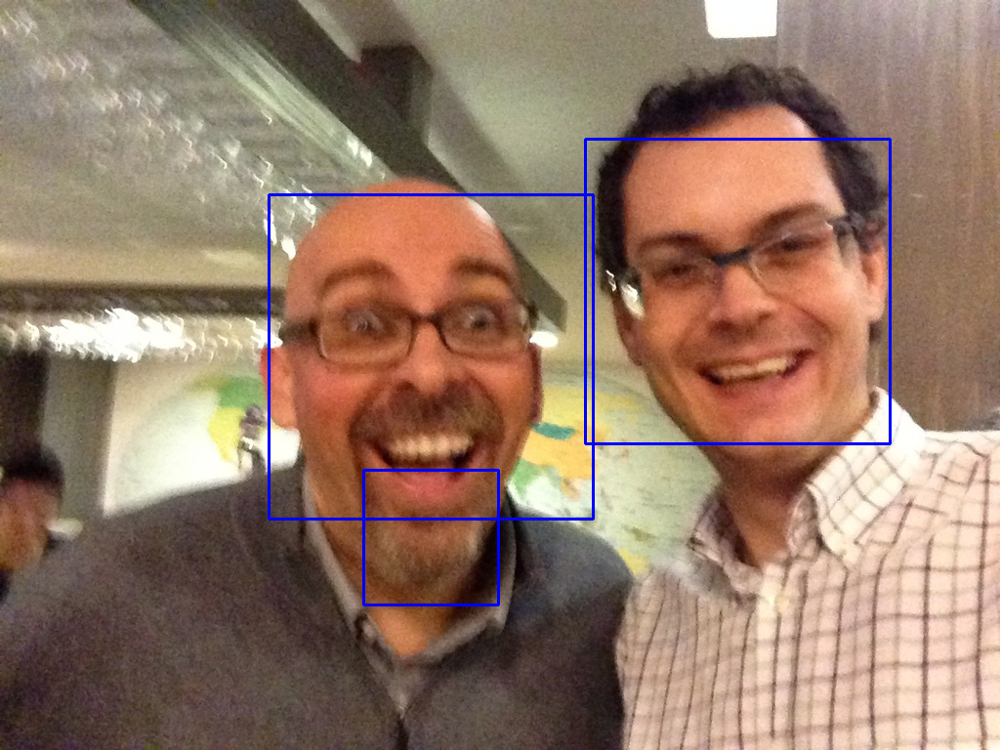

------------------------------
--- Processing: face_subset/images/train/0014d30877173ab7.jpg ---
Found 0 face(s).


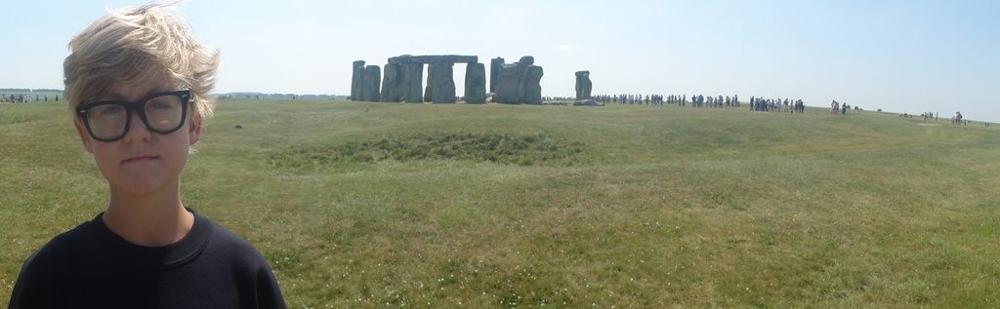

------------------------------
--- Processing: face_subset/images/train/0019f8ef73bbe608.jpg ---
Found 1 face(s).


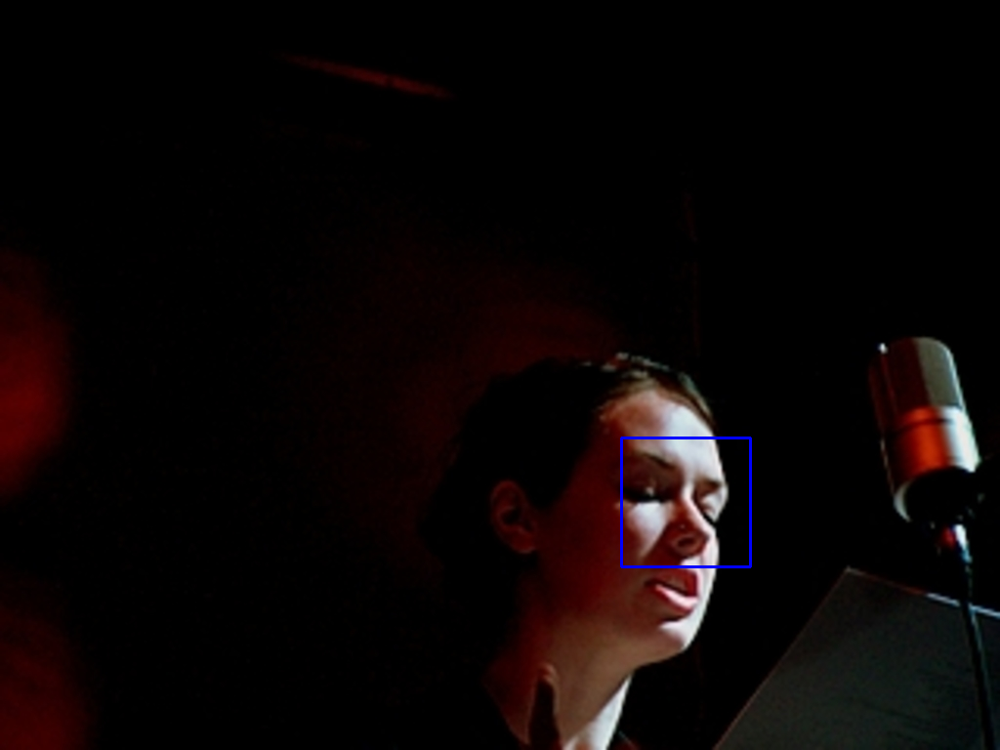

------------------------------


In [ ]:
import cv2
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow

# Load OpenCV's pre-trained Haar Cascade model for face detection
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

if face_cascade.empty():
    print("Error loading cascade classifier.")
else:
    print("Face detector loaded successfully.\n")

    if not extracted_files:
        print("No files were extracted, cannot perform face detection.")

    # Loop over our extracted images
    for image_path in extracted_files:
        print(f"--- Processing: {image_path} ---")

        # Read the image
        img = cv2.imread(image_path)

        if img is None:
            print(f"Could not read image: {image_path}")
            continue

        # Convert the image to grayscale
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        # Perform face detection
        faces = face_cascade.detectMultiScale(gray, 1.1, 4)

        print(f"Found {len(faces)} face(s).")

        # Draw a rectangle around each detected face
        for (x, y, w, h) in faces:
            cv2.rectangle(img, (x, y), (x+w, y+h), (255, 0, 0), 2)

        # Display the output image in Colab
        cv2_imshow(img)
        print("-" * 30)